<a href="https://www.kaggle.com/code/subhadipde2000/waste-classification-with-kerascv?scriptVersionId=195741448" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction:

In the realm of environmental sustainability, waste management is a critical challenge that necessitates innovative solutions. One of the key aspects of effective waste management is the accurate classification of different types of waste. This classification enables efficient recycling, disposal, and resource recovery processes. Traditional methods of waste classification often rely on manual sorting, which is labor-intensive and prone to human error.

To address these issues, this project aims to leverage the power of computer vision and deep learning to develop an automated waste classification system. By utilizing a dataset of 15,000 images, divided into two categories—default (studio images) and real-world (images of waste in natural settings)—we aim to train a robust model capable of accurately identifying various types of waste.

# Problem Statement:

The primary objective of this project is to build a computer vision model that can classify different types of waste with high accuracy. The dataset consists of 15,000 images, categorized into two distinct groups:
1. **Default Images**: These are studio images of waste, which are clean and clear, providing a controlled environment for training the model.
2. **Real-World Images**: These images capture waste in its natural setting, introducing variability and complexity that the model must learn to handle.

To achieve this, the project will involve several key steps:
1. **Image Preprocessing**: Enhancing the quality and consistency of the images to improve the model's performance.
2. **Image Augmentation**: Generating additional training data by applying various transformations to the existing images, thereby increasing the model's robustness.
3. **Model Fine-Tuning**: Utilizing the EfficientNetV2B3 model, a state-of-the-art convolutional neural network, and fine-tuning it to adapt to the specific characteristics of the waste classification task.

In [1]:
!nvidia-smi

Sat Sep  7 21:02:34 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P0             27W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Imports

In [2]:
import os
os.environ["KERAS_BACKEND"] = "jax"

import shutil
import keras
import random
import keras_cv
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.utils import image_dataset_from_directory

2024-09-07 21:02:42.945696: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-07 21:02:42.945825: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-07 21:02:43.076660: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
warnings.filterwarnings("ignore")

In [4]:
# Reproducability
tf.keras.utils.set_random_seed(42)

# Exploring the working directory

In [5]:
# Creating a list of directories of all image categories in /kaggle/input/

waste_type_dir = []

for (root, dirs, files) in os.walk('/kaggle/input'):
    if root.split('/')[-3:-1] == ['images', 'images']:
        waste_type_dir.append(root)
        
waste_type_dir.sort()
waste_type_dir[:5]

['/kaggle/input/recyclable-and-household-waste-classification/images/images/aerosol_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_food_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_soda_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_boxes',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_packaging']

# Creating the training, validation and testing directories

In [6]:
# Defining the paths for training, validation, test directories
train_dir = '/kaggle/working/training-images/'
valid_dir = '/kaggle/working/validation-images/'
test_dir = '/kaggle/working/test-images/'

In [7]:
# Creating the directories for training and test images and also creating sub-directories of each waste category
for x in waste_type_dir:
    os.makedirs(train_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(valid_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(test_dir + x.split('/')[-1], exist_ok=True)

# Exploratory Data Analysis

In [8]:
# Creating a dataframe of waste categories and the corressponding number of images in each category

num_images_dict = {'waste_category': [x.split('/')[-1] for x in waste_type_dir],
             'num_images': [(len(os.listdir(x + '/default')) + len(os.listdir(x + '/real_world'))) for x in waste_type_dir],
             'num_default_images': [len(os.listdir(x + '/default')) for x in waste_type_dir],
             'num_real_world_images': [len(os.listdir(x + '/real_world')) for x in waste_type_dir]}

num_images_df = pd.DataFrame.from_dict(num_images_dict)

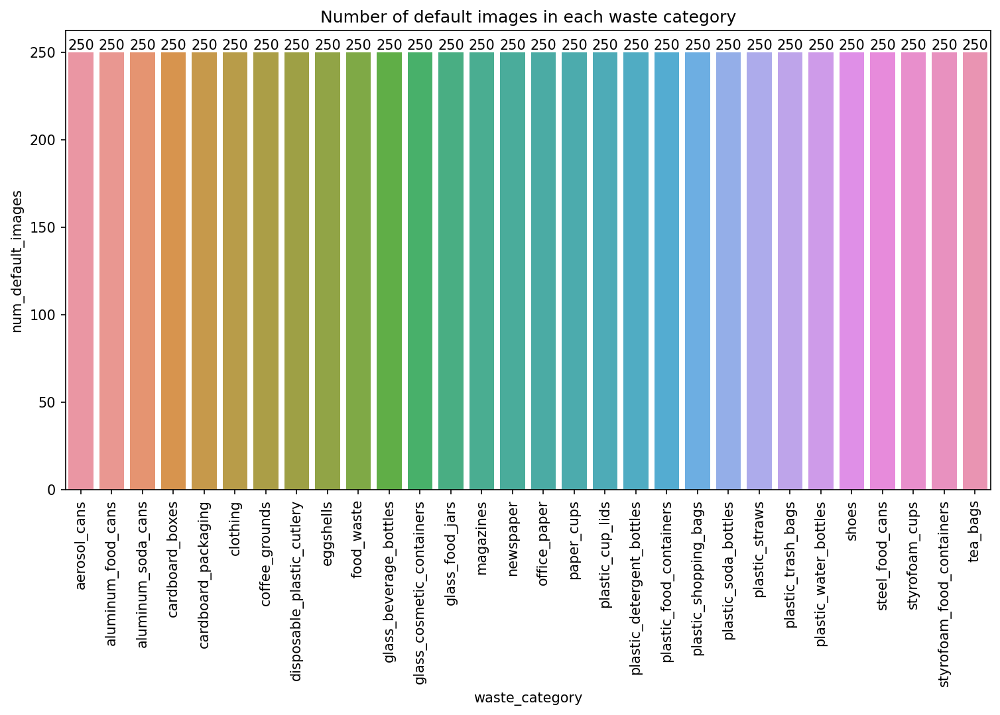

In [9]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of default images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_default_images')
ax.bar_label(ax.containers[0], fontsize=10);

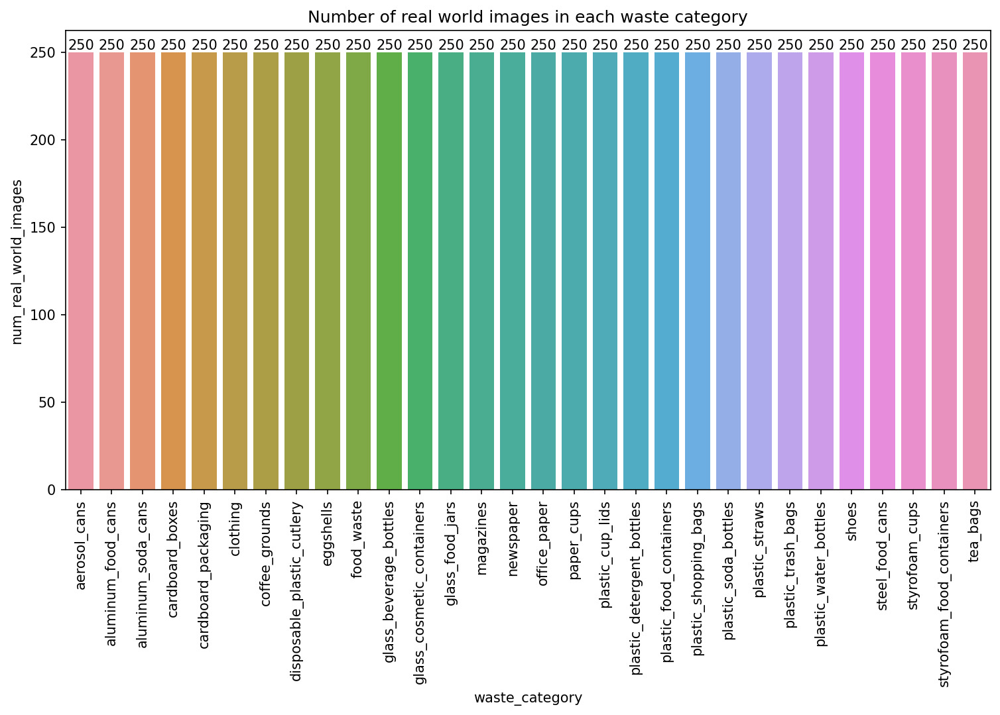

In [10]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of real world images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_real_world_images')
ax.bar_label(ax.containers[0], fontsize=10);

In [11]:
# Function for plotting 2 random images from a folder

def plot_random_images_from_directory(directory_path):
    
    all_files = os.listdir(directory_path) 
    
    if len(all_files) < 4:
        print("Not enough images in the directory to display.")
        return
    
    selected_images = random.sample(all_files, 2)
    fig, axes = plt.subplots(1, 2, figsize=(6, 3), dpi=100)
    
    for i, ax in enumerate(axes.flat):
        image_path = os.path.join(directory_path, selected_images[i])
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        
    class_name = os.path.basename(directory_path)
    fig.suptitle(directory_path.split('/')[-2] + ': ' + class_name, fontsize=16)
    plt.tight_layout()
    plt.show()

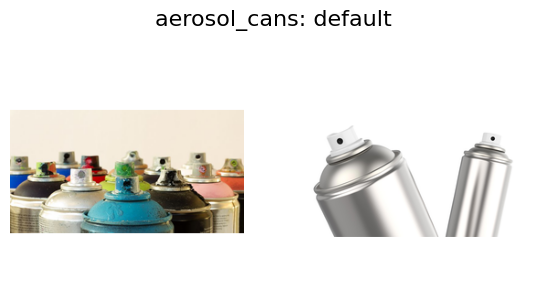

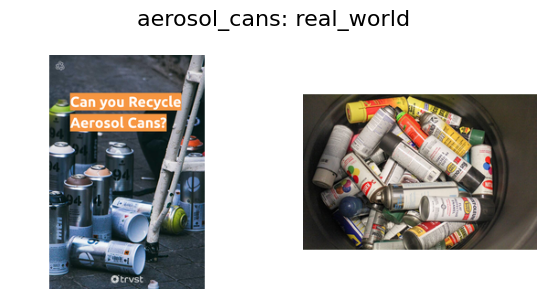

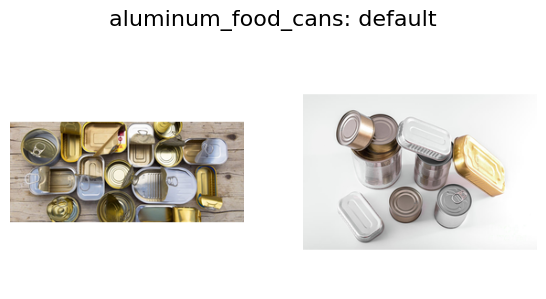

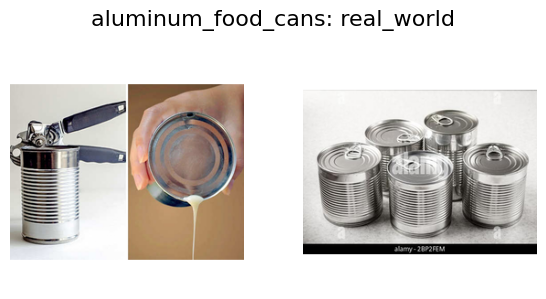

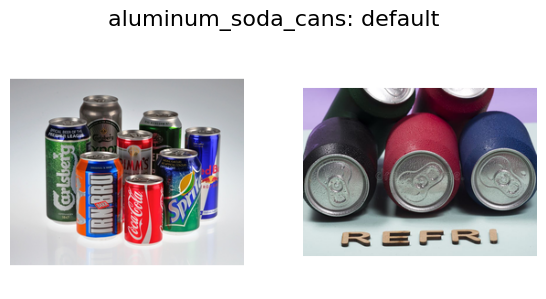

...

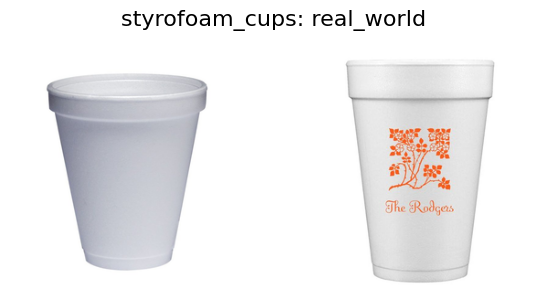

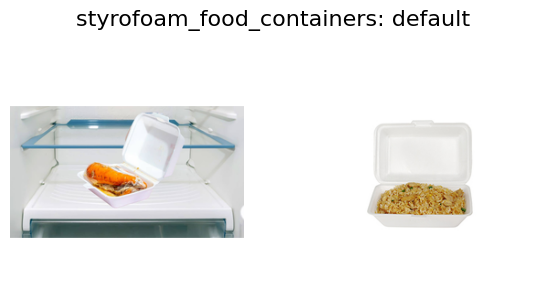

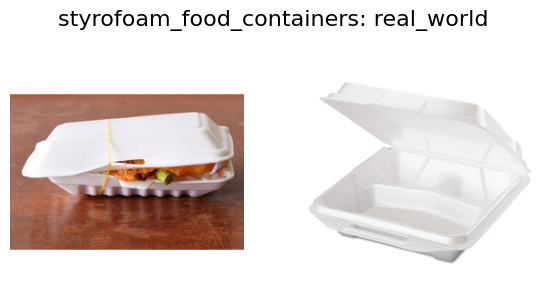

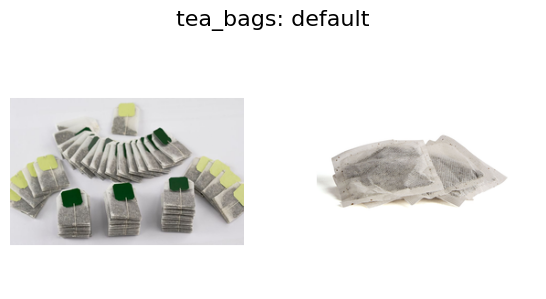

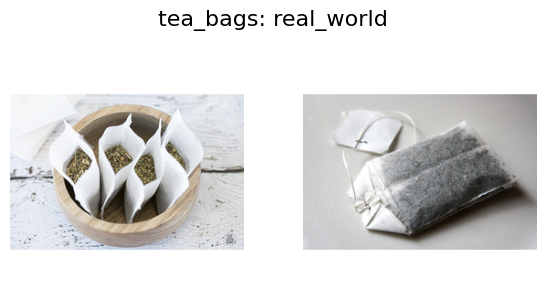

In [12]:
# Visualizing 2 random default and real_world images of every waste category

for directory in waste_type_dir:
    plot_random_images_from_directory(directory + '/default')
    plot_random_images_from_directory(directory + '/real_world')

# Copying the images

* We will now copy all the images to the training-images directory
* From there, we will move 50 images of each waste category to the validation-images and test-images directories

In [13]:
# Creating a list of all image paths in /kaggle/input/

file_paths = []

for directory in waste_type_dir:
    for root, dirs, files in os.walk(directory):
        if root.split('/')[-1] == 'default' or root.split('/')[-1] == 'real_world':
            paths = os.listdir(root)
            for path in paths:
                file_paths.append(os.path.join(root, path))
                
file_paths.sort()

if len(file_paths) == len(set(file_paths)):
    print("There are no duplicate file paths in the list.")
else:
    print(f"There are {len(file_paths)-len(set(file_paths))} duplicate file paths in the list.")

There are no duplicate file paths in the list.


In [14]:
# Copyling all the images to the sub-directories of /kaggle/working/training-images/ according to their waste category

num=0
for src in file_paths:
    fn = src.split('/')[-1]
    dst = train_dir + src.split('/')[-3] + '/'
    if fn not in os.listdir(dst):
        shutil.copy(src, dst)
        num+=1
    elif fn in os.listdir(dst):
        new_fn = 'Image_' + str(250 + int(fn.split('_')[-1].split('.')[0])) + '.png'
        shutil.copy(src, dst + new_fn)
        num+=1

print(f"Fininshed copying {num} images.")

Fininshed copying 15000 images.


* Now, we will move 50 images of each waste category from the training-images directory to the validation-images and test-images directory
* After this, the training-images directory should have 12000 images, and the validation-images & test-images directory should have 1500 images each

In [15]:
# Moving 50 images of each waste category from the training-images directory to the validation-images and test-images directory

for root, dirs, files in os.walk('/kaggle/working/training-images'):
    if root.split('/')[-1] != 'training-images':
        for i in range(50):
            src_path_test = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_test = '/kaggle/working/test-images/' + root.split('/')[-1]
            shutil.move(src_path_test, dst_path_test)
            src_path_valid = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_valid = '/kaggle/working/validation-images/' + root.split('/')[-1]
            shutil.move(src_path_valid, dst_path_valid)
            
print("50 images of each waste category were moved to the validation and test directories.")

50 images of each waste category were moved to the validation and test directories.


* **NOTE:** We won't carry out any image preprocessing here because all the images in the dataset are already 256 by 256 pixels in size.

# Building tensorflow image datasets

In [16]:
def build_img_dataset(directory, BATCH_SIZE=64, SEED=101, IMG_SIZE=(224, 224), class_names=False, shuffle=True):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory=directory,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        image_size=IMG_SIZE,
        interpolation='bilinear',
        shuffle=shuffle,
        seed=SEED
    )
    
    class_names = dataset.class_names
    
    dataset = dataset.cache().prefetch(tf.data.AUTOTUNE)
    
    return (dataset, class_names if class_names else None)

In [17]:
train_data = build_img_dataset(train_dir)[0]
valid_data = build_img_dataset(valid_dir)[0]
test_data, test_classes = build_img_dataset(test_dir, class_names=True) # will need test_classes in visualizing predictions

Found 12000 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.


# Image Augmentations

Data augmentation is a technique to make your model robust to changes in input data such as lighting, cropping, and orientation. One caveat to be aware of with image data augmentation is that you must be careful to not shift your augmented data distribution too far from the original data distribution. The goal is to prevent overfitting and increase generalization, but samples that lie completely out of the data distribution simply add noise to the training process.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [18]:
def pack_to_dict(image, label):
    return {"images": image, "labels": label}

train_data = train_data.map(pack_to_dict, num_parallel_calls=tf.data.AUTOTUNE)

In [19]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

def visualize_images(rows=2, cols=2, augmentation=None, images=image_batch):
    keras_cv.visualization.plot_image_gallery(
        augmentation(images) if augmentation else images,
        rows = rows,
        cols = cols,
        value_range = (0, 255),
        show = True,
    )

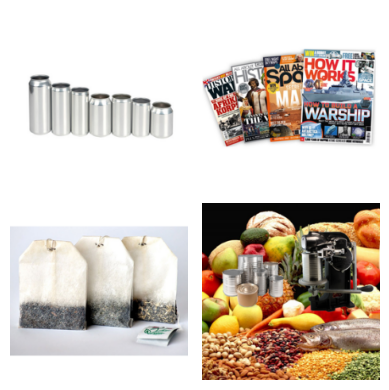

In [20]:
# Images before applying augmentation
visualize_images()

### RandomFlip Augmentation

The first augmentation we'll use is RandomFlip. This augmentation either flips the image horizontally, or vertically, or both.

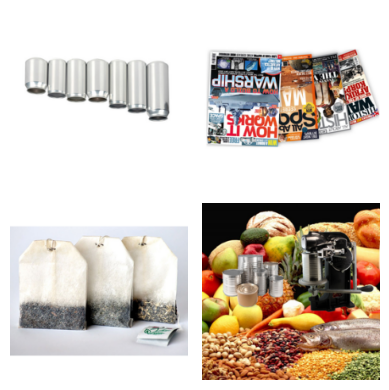

In [21]:
random_flip = keras_cv.layers.RandomFlip(
    mode = "horizontal_and_vertical"
)

augmenters = [random_flip]
visualize_images(augmentation = random_flip)

### RandomCropAndResize Augmentation

The next augmentation we'll use is RandomCropAndResize. This operation selects a random subset of the image, then resizes it to the provided target size. By using this augmentation, we force our classifier to become spatially invariant. Additionally, this layer accepts an ```aspect_ratio_factor``` which can be used to distort the aspect ratio of the image. While this can improve model performance, it should be used with caution. It is very easy for an aspect ratio distortion to shift a sample too far from the original training set's data distribution. 


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

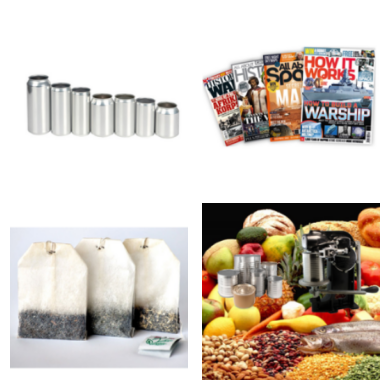

In [22]:
random_crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size = (256, 256),
    crop_area_factor = (0.8, 1.0),
    aspect_ratio_factor = (0.9, 1.1),
)

augmenters += [random_crop_and_resize]
visualize_images(augmentation = random_crop_and_resize)

### RandomCutOut Augmentation

This augmentation technique randomly cuts out rectangles from images and fill them.

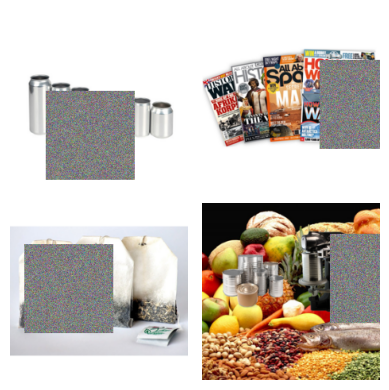

In [23]:
random_cutout = keras_cv.layers.RandomCutout(
    height_factor = (0.5, 0.5),
    width_factor = (0.5, 0.5),
    fill_mode = 'gaussian_noise'
)

augmenters += [random_cutout]
visualize_images(augmentation = random_cutout)

### RandAugmentation Augmentation

```RandAugment``` is actually a set of 10 different augmentations: ```AutoContrast```, ```Equalize```, ```Solarize```, ```RandomColorJitter```, ```RandomContrast```, ```RandomBrightness```, ```ShearX```, ```ShearY```, ```TranslateX``` and ```TranslateY```. At inference time, ```num_augmentations``` augmenters are sampled for each image, and random magnitude factors are sampled for each. These augmentations are then applied sequentially.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

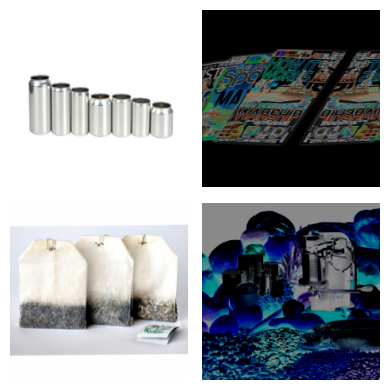

In [24]:
rand_augment = keras_cv.layers.RandAugment(
    value_range = (0, 255),
    augmentations_per_image = 5,
    magnitude = 0,
    magnitude_stddev = 1,
    rate = 10/11,
)

augmenters += [rand_augment]
visualize_images(augmentation = rand_augment)

### CutMix Augmentation

While the random cutouts of the ```RandomCutOut``` layer tackles the problem reasonably well, it can cause the classifier to develop responses to borders between features and the pixel areas caused by the cutout.

```CutMix``` solves the same issue by using a more complex (and more effective) technique. Instead of replacing the cut-out areas with random noise, ```CutMix``` replaces these regions with regions of other images sampled from within your training set! Following this replacement, the image's classification label is updated to be a blend of the original and mixed image's class label.

**NOTE:** ```CutMix``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

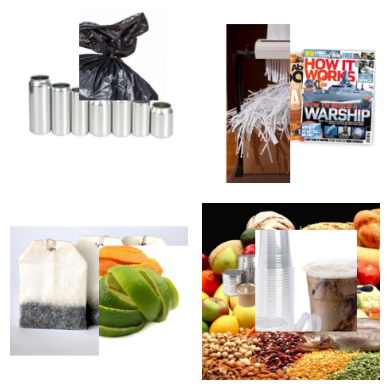

In [25]:
cut_mix = keras_cv.layers.CutMix()
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = cut_mix(inputs)['images'])

### MixUp Augmentation

```MixUp()``` works by sampling two images from a batch, then proceeding to literally blend together their pixel intensities as well as their classification labels.

**NOTE:** ```MixUp``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

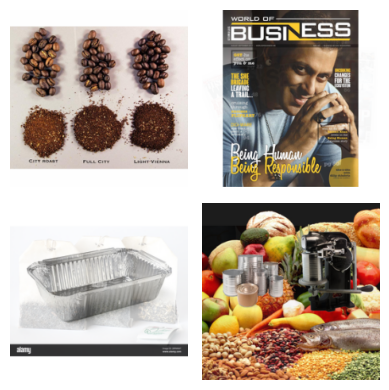

In [26]:
mix_up = keras_cv.layers.MixUp(0.5)
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = mix_up(inputs)['images'])

Instead of applying ```CutMix()``` and ```MixUp()``` to every image, we will apply either of them to each batch. We will do this using ```keras_cv.layers.RandomChoice()```.

In [27]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice(
    [cut_mix, mix_up], 
    batchwise = True
)
augmenters += [cut_mix_or_mix_up]

### Creating and applying image augmentation function

In [28]:
def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs
    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)
train_data = train_data.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

### Visualizing the augmented images

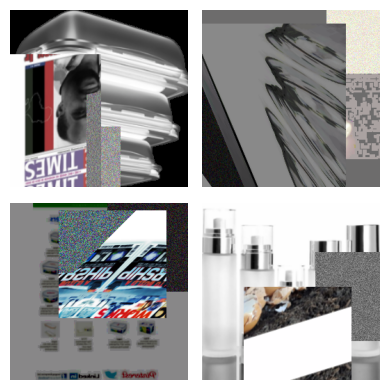

In [29]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

visualize_images(images = image_batch)

In [30]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]

train_data = train_data.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

# Modelling

In [31]:
model = keras_cv.models.ImageClassifier.from_preset(
    "efficientnetv2_b3",
    num_classes = 30,
    pooling="avg",
    activation="softmax",
)

Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b3/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b3/2' to your Kaggle notebook...


In [32]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.AdamW(1e-4),
    metrics=['accuracy']
)

In [33]:
model.summary()

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficient_net_v2_backbone       │ (None, None, None,     │    12,930,622 │
│ (EfficientNetV2Backbone)        │ 1536)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 30)             │        46,110 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,976,732 (49.50 MB)

 Trainable params: 12,867,516 (49.09 MB)

 Non-trainable params: 109,216 (426.62 KB)

# Model training

In [34]:
earlystopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    mode='min',
    min_delta=0.01,
    verbose=1,
    restore_best_weights=True
)

In [35]:
history = model.fit(
    train_data,
    epochs=16,
    validation_data=valid_data,
    callbacks=[earlystopping],
)

Epoch 1/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 341s 2s/step - accuracy: 0.0309 - loss: 3.4614 - val_accuracy: 0.0447 - val_loss: 3.4154
Epoch 2/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 228s 1s/step - accuracy: 0.0369 - loss: 3.4343 - val_accuracy: 0.0647 - val_loss: 3.3675
Epoch 3/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.0462 - loss: 3.4188 - val_accuracy: 0.0927 - val_loss: 3.2776
Epoch 4/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 204s 1s/step - accuracy: 0.0561 - loss: 3.3985 - val_accuracy: 0.1120 - val_loss: 3.2184
Epoch 5/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 207s 1s/step - accuracy: 0.0630 - loss: 3.3815 - val_accuracy: 0.1307 - val_loss: 3.1314
Epoch 6/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 208s 1s/step - accuracy: 0.0703 - loss: 3.3578 - val_accuracy: 0.1153 - val_loss: 3.1593
Epoch 7/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 204s 1s/step - accuracy: 0.0720 - loss: 3.3545 - val_accuracy: 0.1287 - val_loss: 3.0885
Epoch 8/16
188/188 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.0682 - loss: 3.3453 - val_accu

# Plotting the model accuracy and model loss

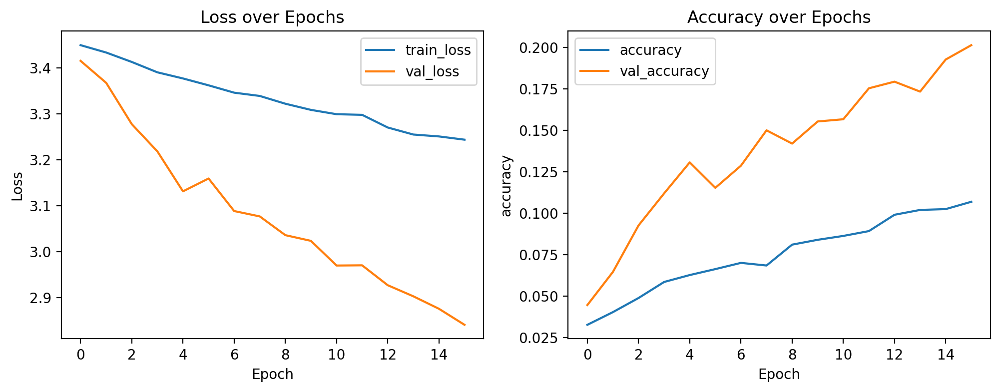

In [36]:
plt.figure(figsize=(12, 4), dpi=200)
# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.show();

# Model evaluation

In [37]:
loss, accuracy = model.evaluate(test_data)
print(f"The model loss on the test dataset is {round(loss, 4)}.")
print(f"The model accuracy on the test dataset is {round(accuracy, 2)*100}%.")

24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - accuracy: 0.1948 - loss: 2.8492
The model loss on the test dataset is 2.8444.
The model accuracy on the test dataset is 19.0%.


* We will now plot 9 random images from the test dataset along with their true and predcited labels
* If the predicted label matches the original label, the labels will be coloured in green, else, the labels will be coloured in red

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


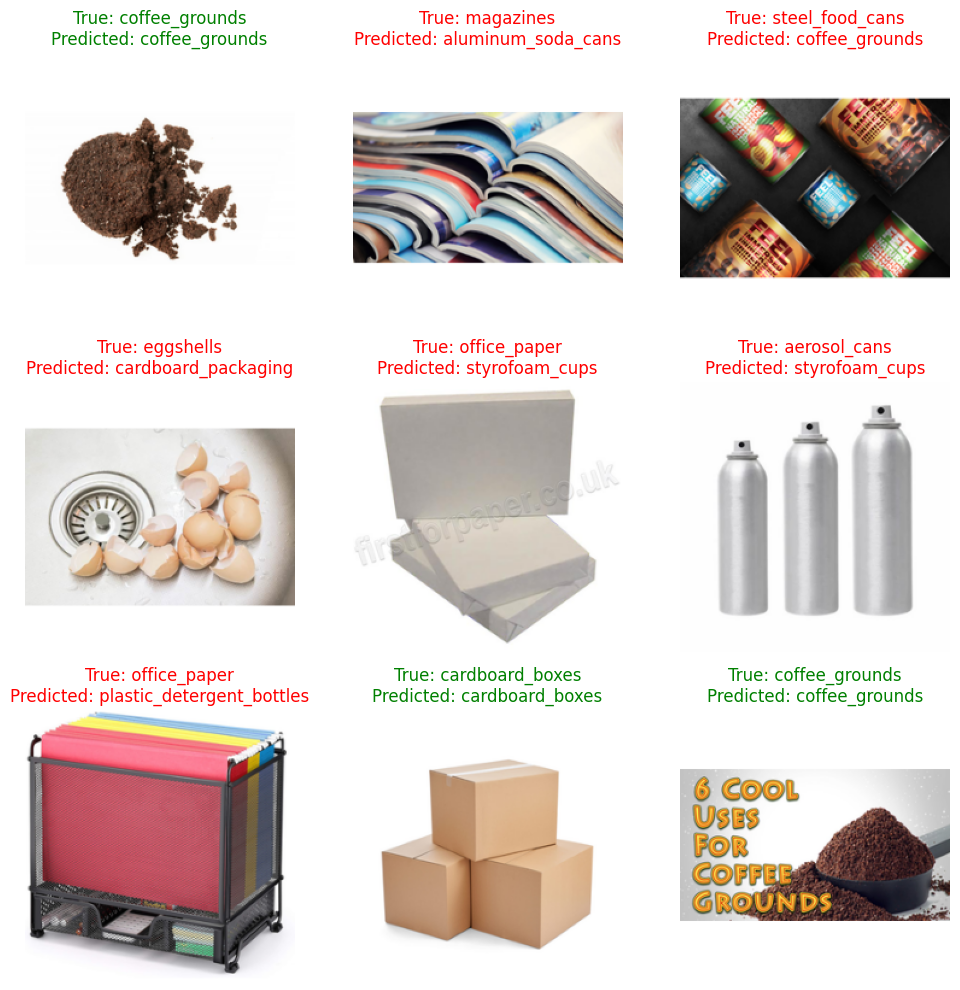

In [38]:
# Function to display a grid of images with predictions and true labels
def display_images_with_predictions_and_true_labels(dataset, model, test_classes, num_images=9):
    plt.figure(figsize=(10, 10))

    # Take a batch from the dataset and select random images
    for images, labels in dataset.take(1):
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        random_images = images.numpy()[indices]
        true_labels = labels.numpy()[indices]
        
        # Convert true labels to integer indices if they are one-hot encoded
        if len(true_labels.shape) > 1:
            true_labels = np.argmax(true_labels, axis=1)

        predictions = model.predict(random_images)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(num_images):
            plt.subplot(3, 3, i + 1)
            plt.imshow(random_images[i].astype("uint8"))
            if true_labels[i] == predicted_labels[i]:
                color = 'green'
            else:
                color = 'red'
            plt.title(f"True: {test_classes[true_labels[i]]}\nPredicted: {test_classes[predicted_labels[i]]}",
                      color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

display_images_with_predictions_and_true_labels(test_data, model, test_classes)